In [2]:
import pandas as pd
import numpy as np
import os
from matplotlib import pyplot as plt
plt.rcParams["figure.figsize"] = (12,12)

In [3]:
filename = '../csv_detection_info/2, artrose.csv'
filename_clean = '../csv_detection_info_clean/2, artrose.csv'
saved_cropped_image = '//nmbu.no/LargeFile/Project/CubiAI/preprocess/cropped/2, artrose'

In [9]:
detection_df[detection_df.filename=='1.2.276.0.95.28994.20180223.114605.0.dcm']

,base_path,filename,ax0_min,ax0_max,ax1_min,ax1_max,confidence,diagnosis,diagnosis_raw
14,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.28994.20180223.114605.0.dcm,0,0,0,0,0.0,2,"2, artrose"


In [4]:
detection_df = pd.read_csv(filename)

In [8]:
detection_df.filename.iloc[0]

'1.2.276.0.82.1.1.1314.1498695243.10.100.37.110.5694053541.3.1277.dcm'

### [Optional] Sort by confidence (filter out bad prediction)

In [6]:
# detection_df = detection_df[detection_df.confidence > 0.5]

In [7]:
detection_df[detection_df.confidence < 0.5].index

Int64Index([ 11,  14,  46,  47,  59,  98, 140, 148, 149, 159, 171, 172, 173,
            174, 201, 290, 352, 386, 404, 405, 406],
           dtype='int64')

Note that there is one case that is not good

### Look at the crop images

Are they reasonable, if not, mark the "weird", "wrong detected" image indice before saving it back to the clean folder

In [8]:
# plot every 9 of them

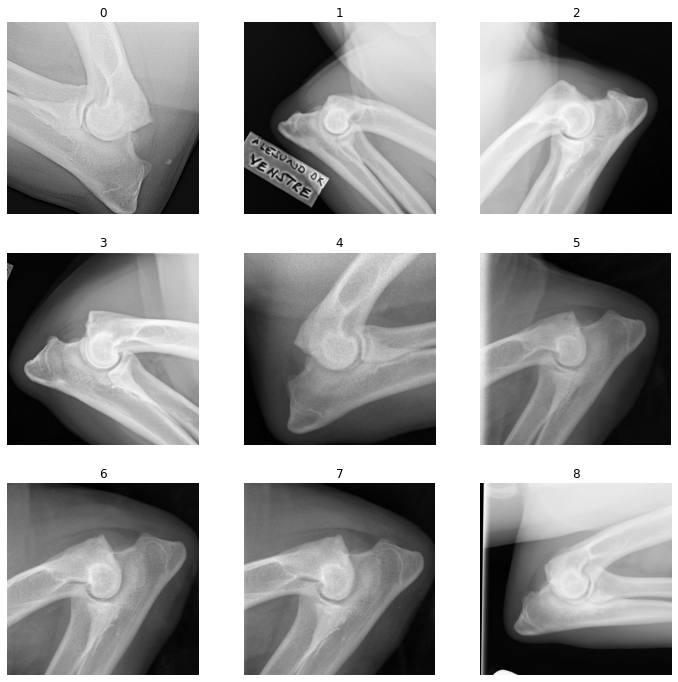

C:\NMBU\TEMP\ipykernel_19188\89006417.py:5: UserWarning: Attempting to set identical left == right == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(img, 'gray')
C:\NMBU\TEMP\ipykernel_19188\89006417.py:5: UserWarning: Attempting to set identical bottom == top == -0.5 results in singular transformations; automatically expanding.
  plt.imshow(img, 'gray')


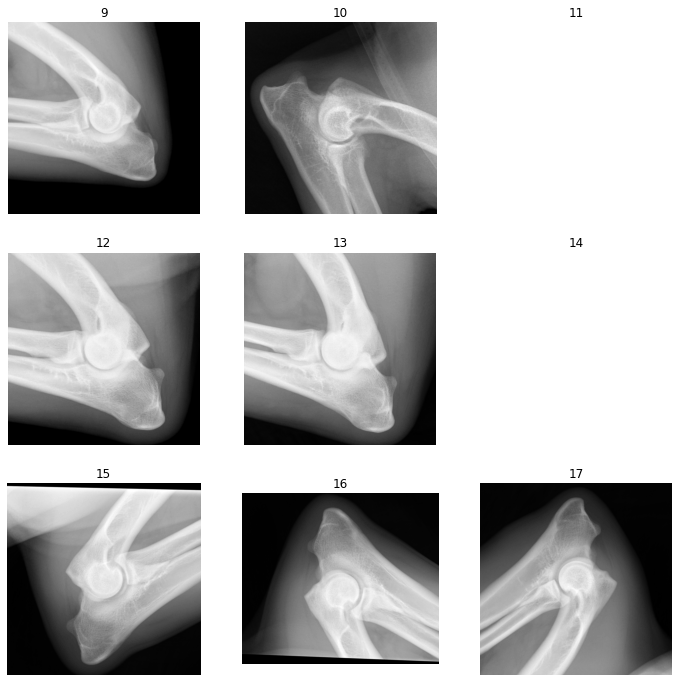

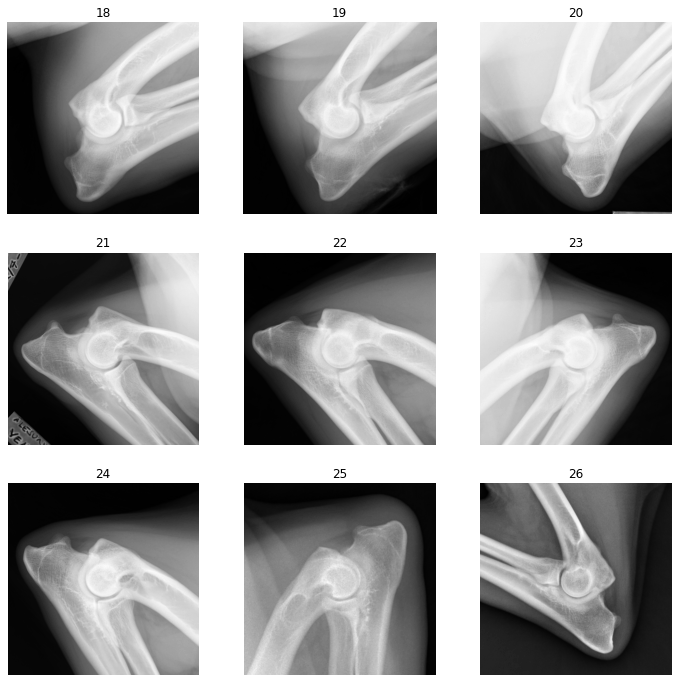

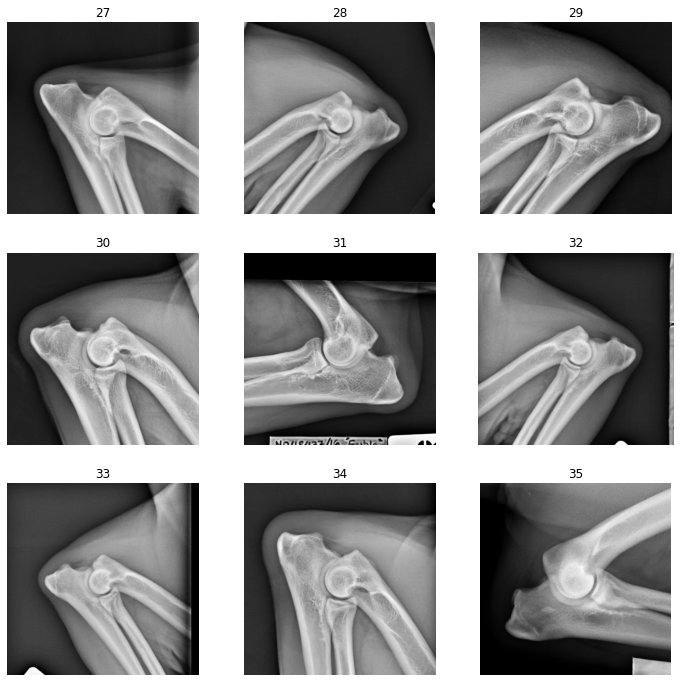

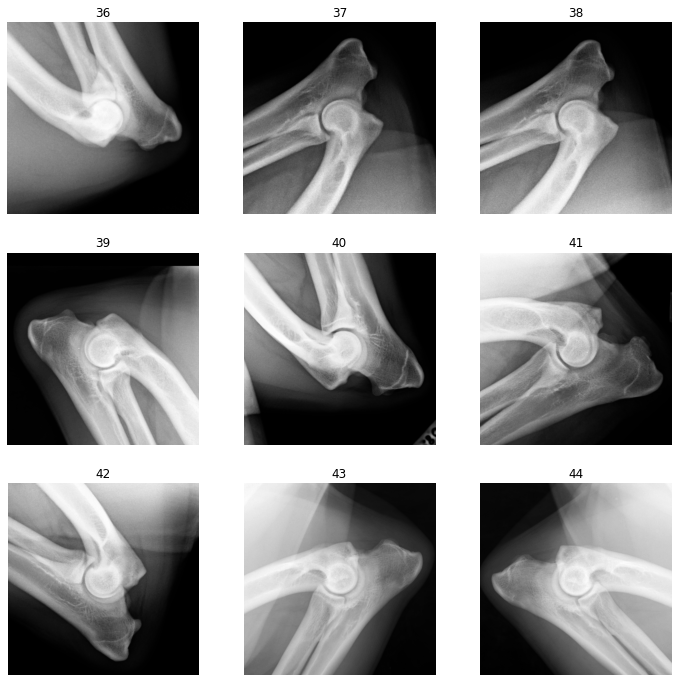

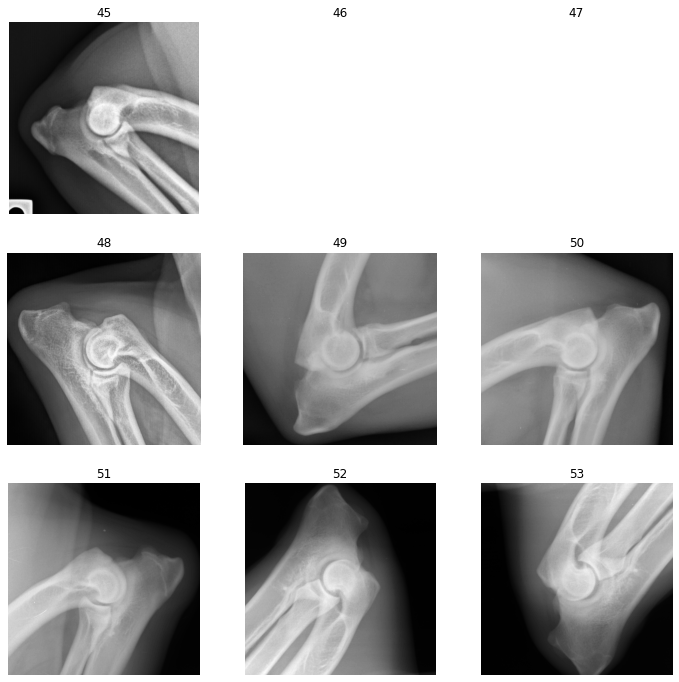

...

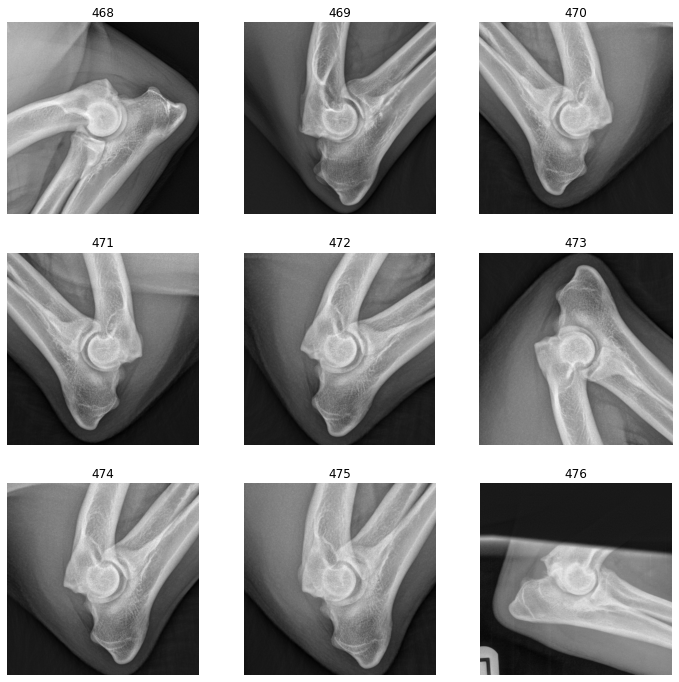

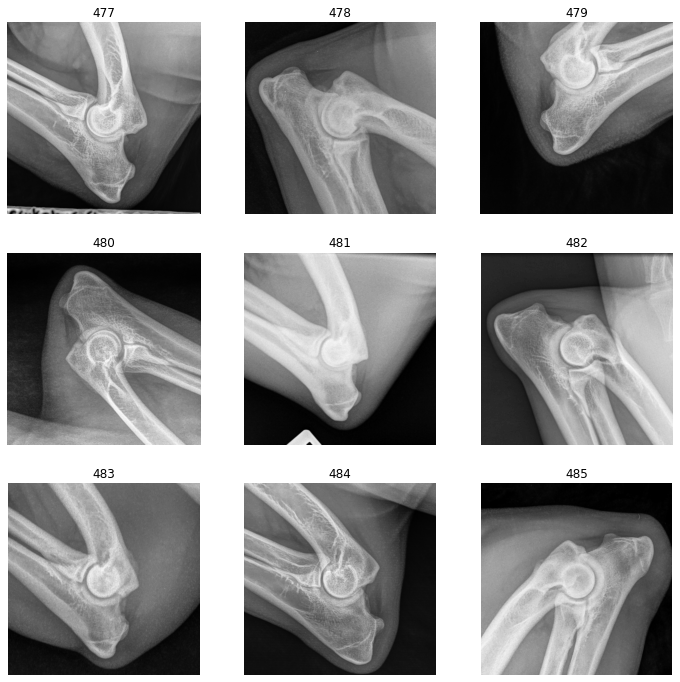

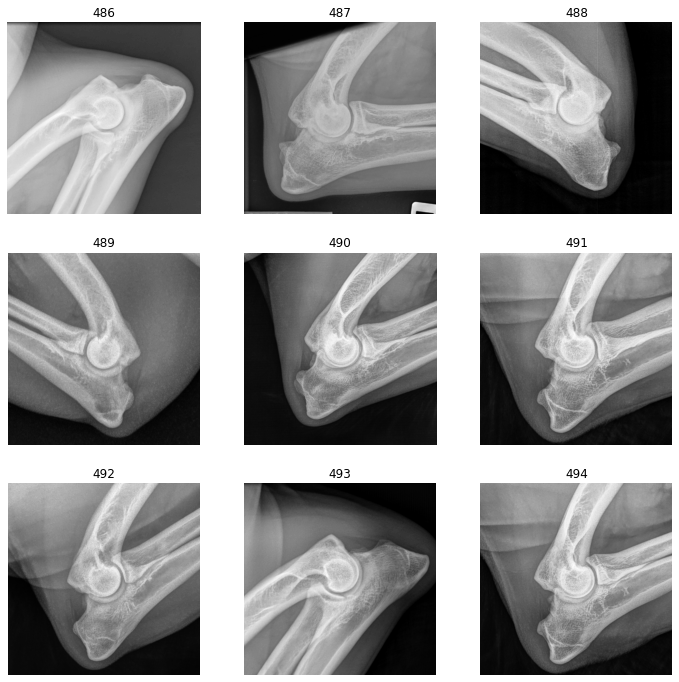

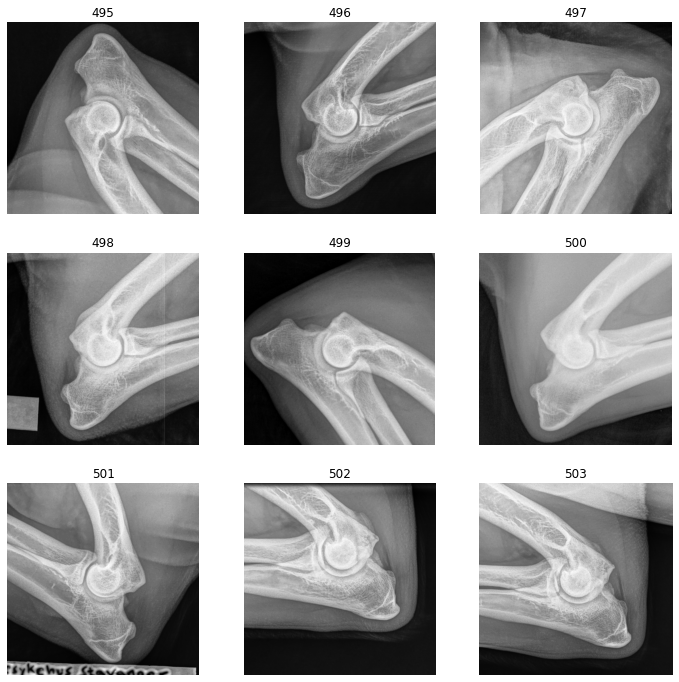

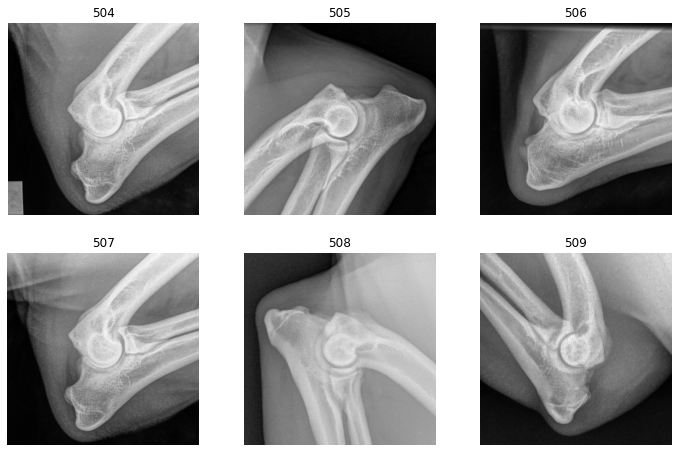

In [8]:
for id, item in detection_df.iterrows():
    fn = item['filename']
    img = np.load(saved_cropped_image + '/' + fn + '.npy')
    plt.subplot(3,3, (id%9) + 1)
    plt.imshow(img, 'gray')
    plt.axis('off')
    plt.title(str(id))
    
    if (id%9) == 8:
        plt.show()
        
plt.show()

## Remove bad detection items

In [10]:
remove_indice = [ 11, 14,  46,  47,  59, 113, 140, 159, 171, 172, 173,
            174, 290, 405, 406]
detection_df[~detection_df.index.isin(remove_indice)]

,base_path,filename,ax0_min,ax0_max,ax1_min,ax1_max,confidence,diagnosis,diagnosis_raw
0,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.82.1.1.1314.1498695243.10.100.37.110...,1763,1935,1123,1295,0.521844,2,"2, artrose"
1,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.17743.20180723.143656.0.dcm,543,688,581,726,0.659902,2,"2, artrose"
2,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.17743.20180921.93825.0.dcm,626,771,669,814,0.854517,2,"2, artrose"
3,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.17743.20181102.123221.0.dcm,1248,1403,1344,1499,0.999568,2,"2, artrose"
4,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.2.276.0.95.17831.20180509.101856.0.0.dcm,777,969,926,1118,0.957726,2,"2, artrose"
...,...,...,...,...,...,...,...,...,...
505,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.12372064863.29532.33861.32956.38874...,267,398,706,837,0.999998,2,"2, artrose"
506,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.12576043049.32749.32589.44897.40099...,391,603,824,1036,0.996586,2,"2, artrose"
507,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.12584167137.18173.8257.46037.52880....,600,798,1275,1473,0.999903,2,"2, artrose"
508,//nmbu.no/LargeFile/Project/CubiAI/sortering/d...,1.3.51.0.7.12699509545.64057.52807.43307.51748...,772,917,2247,2392,0.999992,2,"2, artrose"


In [11]:
new_detection_df = detection_df[~detection_df.index.isin(remove_indice)]

In [12]:
new_detection_df.to_csv(filename_clean, index=False)